In [84]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [85]:
import pandas as pd
import numpy as np 

import matplotlib.pyplot as plt
import seaborn as sns

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler ,LabelEncoder
 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier 
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import classification_report ,confusion_matrix,accuracy_score
from sklearn.model_selection import GridSearchCV

In [86]:
df_test=pd.read_csv(r"c:\Users\SHREEN\Downloads\pendigits-tes.csv")
df_test

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3492,36,100,24,70,0,38,49,33,95,47,87,55,96,21,100,0,4
3493,16,75,41,100,52,64,32,27,0,0,21,9,62,2,100,14,2
3494,56,100,27,79,0,39,12,0,66,15,100,51,93,93,38,93,0
3495,19,100,0,61,3,23,48,0,97,27,100,66,62,97,10,81,0


In [ ]:
#Explore Data

df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3497 entries, 0 to 3496
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    88     3497 non-null   int64
 1    92     3497 non-null   int64
 2     2     3497 non-null   int64
 3    99     3497 non-null   int64
 4    16     3497 non-null   int64
 5    66     3497 non-null   int64
 6    94     3497 non-null   int64
 7    37     3497 non-null   int64
 8    70     3497 non-null   int64
 9     0     3497 non-null   int64
 10    0.1   3497 non-null   int64
 11   24     3497 non-null   int64
 12   42     3497 non-null   int64
 13   65     3497 non-null   int64
 14  100     3497 non-null   int64
 15  100.1   3497 non-null   int64
 16   8      3497 non-null   int64
dtypes: int64(17)
memory usage: 464.6 KB


In [88]:
df_test.describe()

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
count,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000,3497.000000
mean,41.864741,86.063197,41.902488,85.665713,47.405776,66.706034,50.668859,44.285387,56.304547,32.905919,58.602802,32.781813,55.717186,33.077495,48.287675,29.424936,4.432085
std,35.991986,14.738850,26.481556,17.962029,32.134929,26.134147,30.347466,28.231316,35.093430,26.783980,37.547831,26.186722,21.747598,32.937845,42.231067,35.690174,2.877063
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.000000,77.000000,22.000000,75.000000,19.000000,52.000000,29.000000,26.000000,26.000000,6.000000,21.000000,11.000000,43.000000,4.000000,0.000000,0.000000,2.000000
50%,34.000000,90.000000,42.000000,94.000000,49.000000,71.000000,52.000000,44.000000,59.000000,32.000000,70.000000,28.000000,53.000000,25.000000,42.000000,12.000000,4.000000
75%,75.000000,100.000000,60.000000,100.000000,73.000000,87.000000,73.000000,63.000000,91.000000,52.000000,94.000000,52.000000,68.000000,47.000000,100.000000,51.000000,7.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,9.000000


In [89]:
df=pd.read_csv(r"c:\Users\SHREEN\Downloads\pendigits-tra.csv")
df

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7488,0,82,9,59,56,34,41,0,10,30,3,67,42,96,100,100,5
7489,49,100,0,70,24,56,100,65,86,85,44,77,21,38,6,0,4
7490,100,98,60,100,24,87,3,58,35,51,58,26,36,0,0,5,5
7491,59,65,91,100,84,96,72,50,51,8,0,0,45,1,100,0,1


In [90]:
df.describe()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
count,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000,7493.000000
mean,37.383024,84.677299,40.007340,82.889764,50.877486,65.048178,51.475244,44.605632,57.137595,34.070599,61.418124,35.779794,54.693714,35.793541,46.814627,28.556119,4.430402
std,33.324063,16.848615,26.257347,19.639880,34.929460,27.377250,30.680711,30.657194,33.676120,27.461524,37.133187,27.496951,22.595228,33.219926,41.534491,35.804498,2.876877
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,76.000000,20.000000,70.000000,17.000000,48.000000,28.000000,22.000000,30.000000,7.000000,25.000000,12.000000,41.000000,7.000000,0.000000,0.000000,2.000000
50%,31.000000,89.000000,39.000000,89.000000,56.000000,71.000000,54.000000,42.000000,60.000000,33.000000,74.000000,32.000000,53.000000,28.000000,39.000000,8.000000,4.000000
75%,61.000000,100.000000,58.000000,100.000000,81.000000,86.000000,75.000000,65.000000,88.000000,55.000000,98.000000,57.000000,69.000000,48.000000,100.000000,51.000000,7.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,9.000000


In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0    47     7493 non-null   int64
 1   100     7493 non-null   int64
 2    27     7493 non-null   int64
 3    81     7493 non-null   int64
 4    57     7493 non-null   int64
 5    37     7493 non-null   int64
 6    26     7493 non-null   int64
 7     0     7493 non-null   int64
 8     0.1   7493 non-null   int64
 9    23     7493 non-null   int64
 10   56     7493 non-null   int64
 11   53     7493 non-null   int64
 12  100.1   7493 non-null   int64
 13   90     7493 non-null   int64
 14   40     7493 non-null   int64
 15   98     7493 non-null   int64
 16   8      7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB


In [ ]:
#Chick Douplicates

df.drop_duplicates()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7488,0,82,9,59,56,34,41,0,10,30,3,67,42,96,100,100,5
7489,49,100,0,70,24,56,100,65,86,85,44,77,21,38,6,0,4
7490,100,98,60,100,24,87,3,58,35,51,58,26,36,0,0,5,5
7491,59,65,91,100,84,96,72,50,51,8,0,0,45,1,100,0,1


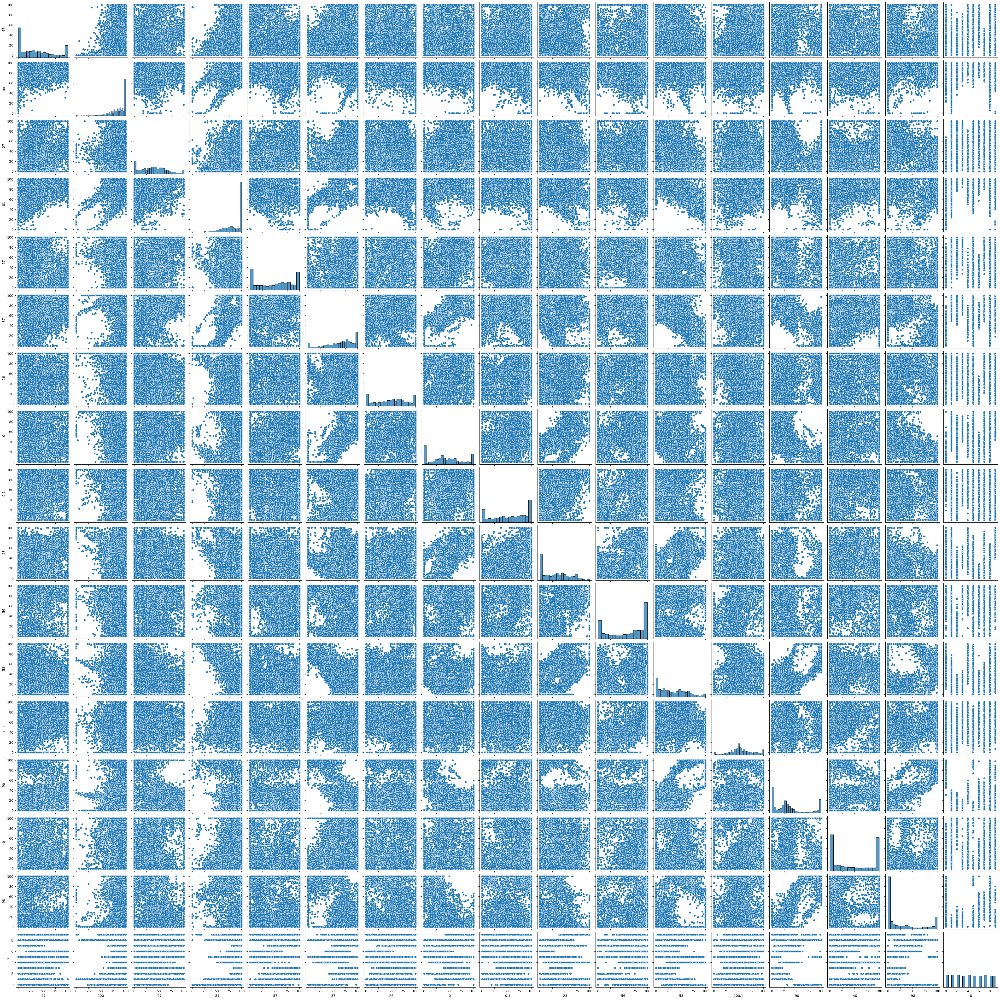

In [ ]:
#Some Visualisation

sns.pairplot(df)
plt.show()

In [105]:
x_train=df.iloc[ : , :-1]
y_train=df.iloc[ : ,-1]
x_test=df_test.iloc[ : , :-1]
y_test=df_test.iloc[ : , -1]

In [95]:
smote = SMOTE(random_state=42)
x_train, y_train = smote.fit_resample(x_train, y_train)

In [117]:
dtc=DecisionTreeClassifier(criterion='gini', random_state=42)
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(dtc, param_grid, cv=5, scoring='accuracy',verbose=0)
grid_search.fit(x_train , y_train)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'max_depth': [None, 5, 10, 15],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [118]:
y_predic=grid_search.predict(x_test)

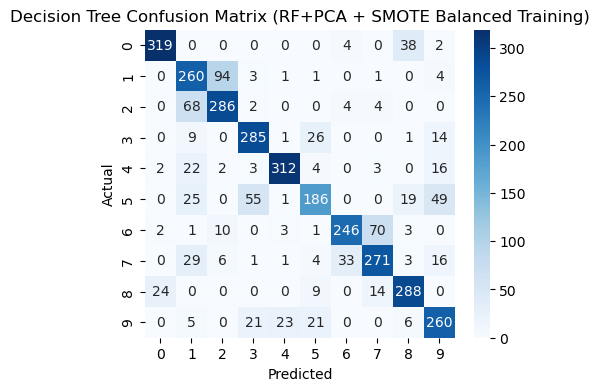

In [120]:
cm_dt = confusion_matrix(y_test, y_predic)

plt.figure(figsize=(5, 4))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues')
plt.title("Decision Tree Confusion Matrix (RF+PCA + SMOTE Balanced Training)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [121]:
print(classification_report(y_test,y_predic))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90       363
           1       0.62      0.71      0.66       364
           2       0.72      0.79      0.75       364
           3       0.77      0.85      0.81       336
           4       0.91      0.86      0.88       364
           5       0.74      0.56      0.63       335
           6       0.86      0.73      0.79       336
           7       0.75      0.74      0.75       364
           8       0.80      0.86      0.83       335
           9       0.72      0.77      0.75       336

    accuracy                           0.78      3497
   macro avg       0.78      0.77      0.78      3497
weighted avg       0.78      0.78      0.78      3497



In [125]:
n_estimators_values = [10, 50, 100, 150, 200]
accuracy_scores=[]
for n in n_estimators_values:
    clf=RandomForestClassifier(n,random_state=42,verbose=0)
    clf.fit(x_train,y_train)
    model = SelectFromModel(clf,threshold='median')
    x_train = model.transform(x_train)
    x_test = model.transform(x_test)
    y_pred=clf.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_scores.append(accuracy)
best_accuracy = max(accuracy_scores)
print(f"n_estimators: {n}, Accuracy: {accuracy:}")


n_estimators: 200, Accuracy: 0.3674578209894195


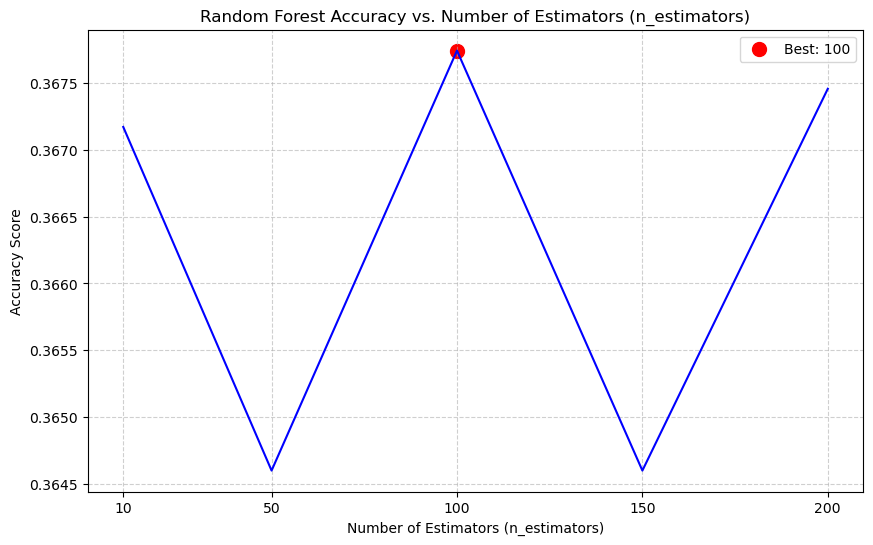

In [126]:
best_n_estimators = n_estimators_values[np.argmax(accuracy_scores)]
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_values, accuracy_scores, color='blue')


plt.scatter(best_n_estimators, best_accuracy, color='red', s=100, label=f'Best: {best_n_estimators}')


plt.title('Random Forest Accuracy vs. Number of Estimators (n_estimators)')
plt.xlabel('Number of Estimators (n_estimators)')
plt.ylabel('Accuracy Score')
plt.xticks(n_estimators_values) 
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.show()

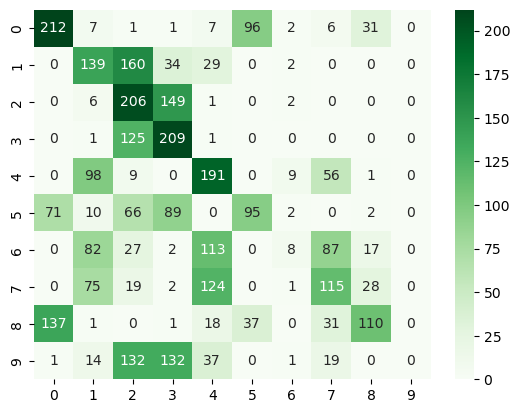

In [127]:
cm=confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True,fmt='d',cmap='Greens')
plt.show()

In [128]:
n_estimators_values = [10, 50, 100, 200]
accuracy_n = []
fixed_learning_rate = 0.1

for n in n_estimators_values:
    gb_model = GradientBoostingClassifier(n_estimators=n, learning_rate=fixed_learning_rate, random_state=42)
    gb_model.fit(x_train, y_train)
    y_pred = gb_model.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    accuracy_n.append(acc)
    print(f"n_estimators: {n}, Accuracy: {acc:}")

n_estimators: 10, Accuracy: 0.3640263082642265
n_estimators: 50, Accuracy: 0.37374892765227336
n_estimators: 100, Accuracy: 0.36860165856448385
n_estimators: 200, Accuracy: 0.36974549613954816


In [129]:
learning_rate_values = [0.1, 0.3, 0.5, 0.9]
accuracy_lr = []
for lr in learning_rate_values:
    gb_model = GradientBoostingClassifier(n_estimators=best_n_estimators, learning_rate=lr, random_state=42)
    gb_model.fit(x_train, y_train)
    y_pred = gb_model.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    accuracy_lr.append(acc)
    print(f"Learning Rate: {lr:}, Accuracy: {acc:}")

Learning Rate: 0.1, Accuracy: 0.36860165856448385
Learning Rate: 0.3, Accuracy: 0.36974549613954816
Learning Rate: 0.5, Accuracy: 0.3640263082642265
Learning Rate: 0.9, Accuracy: 0.2976837289104947


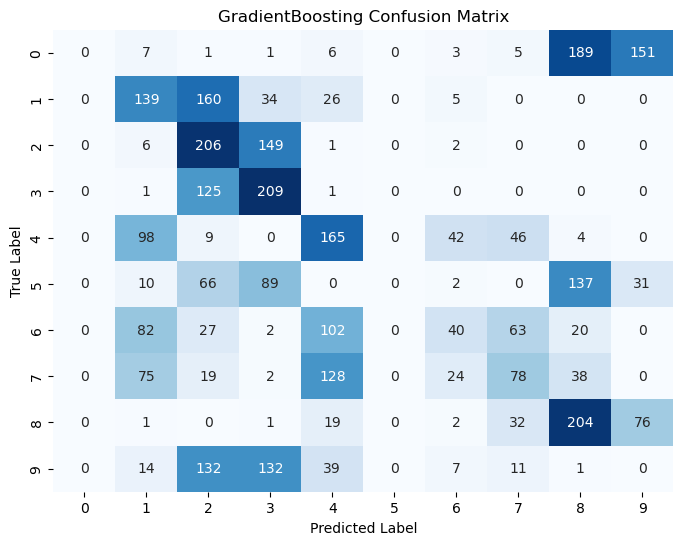

In [130]:
cm_gb = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_gb, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('GradientBoosting Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show() 

XGBoost Accuracy: 0.3671718615956534


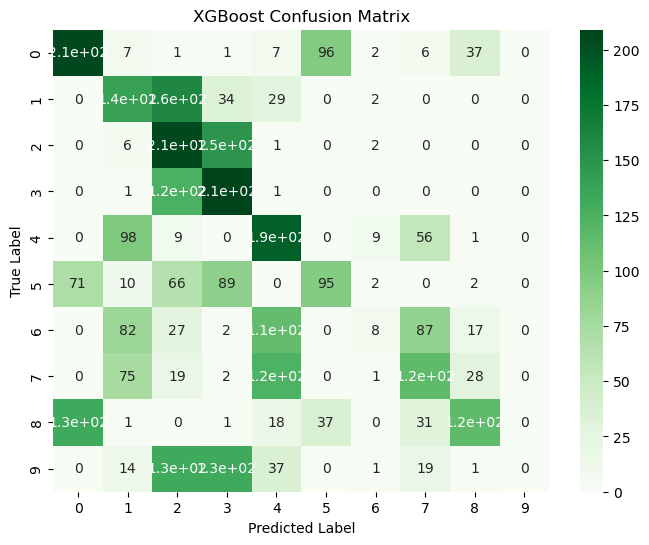

In [131]:
best_learning_rate = learning_rate_values[np.argmax(accuracy_lr)]
xgb_model = XGBClassifier(
    n_estimators=best_n_estimators,
    learning_rate=best_learning_rate,
    eval_metric='mlogloss',   
    random_state=42
)

xgb_model.fit(x_train, y_train)
final_y_pred_xgb = xgb_model.predict(x_test)

final_xgb_accuracy = accuracy_score(y_test, final_y_pred_xgb)

print(f"XGBoost Accuracy: {final_xgb_accuracy:}")


cm_xgb = confusion_matrix(y_test, final_y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, cmap='Greens')
plt.title('XGBoost Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show() 

In [134]:
BEST_MODEL = XGBClassifier(n_estimators=best_n_estimators, learning_rate=best_learning_rate, eval_metric='mlogloss', random_state=42)
n_components = 0.5 
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=n_components)),
    ('model', BEST_MODEL)
])
pipeline.fit(x_train, y_train)
y_pred_pca = pipeline.predict(x_test)

In [136]:
report_pca = classification_report(y_test, y_pred_pca, output_dict=True)

pca_accuracy = accuracy_score(y_test, y_pred_pca)
pca_precision = report_pca['weighted avg']['precision']
pca_recall = report_pca['weighted avg']['recall']
pca_f1 = report_pca['weighted avg']['f1-score']
print(f"Accuracy (PCA): {pca_accuracy:}")
print(f"Precision (PCA): {pca_precision:}")
print(f"Recall (PCA): {pca_recall:}")
print(f"F1-Score (PCA): {pca_f1:}")

Accuracy (PCA): 0.3671718615956534
Precision (PCA): 0.3463938737049537
Recall (PCA): 0.3671718615956534
F1-Score (PCA): 0.33033966350126315


c:\Users\SHREEN\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\SHREEN\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\SHREEN\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
